In [81]:
from sklearn.datasets import fetch_lfw_people
# Load the LFW dataset in color with original image size
lfw_people = fetch_lfw_people(color=True, resize=None, min_faces_per_person=20, funneled=True, download_if_missing=True)

# Print the shape of the data
print(lfw_people.data.shape)

(3023, 35250)


In [5]:
from joblib import dump, load
import numpy as np
from collections import Counter
import os
import cv2
import random

from sklearn.utils import shuffle
from sklearn.datasets import fetch_lfw_people

from sklearn.neural_network import MLPClassifier

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score

from skimage.transform import resize

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms

from PIL import Image

from imblearn.over_sampling import SMOTE, ADASYN

import matplotlib.pyplot as plt
import seaborn as sns

In [82]:
data = lfw_people.data
target = lfw_people.target

In [83]:
data.shape

(3023, 35250)

In [84]:
images = lfw_people.images

In [85]:
images.shape

(3023, 125, 94, 3)

In [86]:
target.shape

(3023,)

In [87]:
lfw_people.target_names.shape

(62,)

In [1]:
import numpy as np

In [89]:
# Get unique classes (person IDs)
np.unique(y)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61], dtype=int64)

In [90]:
X, y = lfw_people.images, lfw_people.target

# Get unique classes (person IDs)
unique_classes = np.unique(y)

# Create a dictionary to hold separated classes
class_images = {class_id: [] for class_id in unique_classes}
images_name = {}
# Separate images into respective classes
for idx, label in enumerate(y):
    class_images[label].append(X[idx])
    images_name[label] = lfw_people.target_names[label]

# Convert lists to numpy arrays
for class_id in class_images:
    class_images[class_id] = np.array(class_images[class_id])

# Print the number of images per class
# for class_id, images in class_images.items():
#     print(f"Class {class_id}, {lfw_people.target_names[class_id]}: {images.shape[0]} images")


In [91]:
class_images_sorted = {class_id: images for class_id, images in sorted(class_images.items(), key=lambda x: len(x[1]), reverse=True)}

for class_id, images in class_images_sorted.items():
    print(f"Class {class_id}, {lfw_people.target_names[class_id]}: {images.shape[0]} images")

Class 14, George W Bush: 530 images
Class 10, Colin Powell: 236 images
Class 58, Tony Blair: 144 images
Class 12, Donald Rumsfeld: 121 images
Class 15, Gerhard Schroeder: 109 images
Class 5, Ariel Sharon: 77 images
Class 21, Hugo Chavez: 71 images
Class 35, Junichiro Koizumi: 60 images
Class 25, Jean Chretien: 55 images
Class 31, John Ashcroft: 53 images
Class 24, Jacques Chirac: 52 images
Class 53, Serena Williams: 52 images
Class 60, Vladimir Putin: 49 images
Class 40, Luiz Inacio Lula da Silva: 48 images
Class 16, Gloria Macapagal Arroyo: 44 images
Class 6, Arnold Schwarzenegger: 42 images
Class 27, Jennifer Capriati: 42 images
Class 37, Laura Bush: 41 images
Class 39, Lleyton Hewitt: 41 images
Class 0, Alejandro Toledo: 39 images
Class 20, Hans Blix: 39 images
Class 45, Nestor Kirchner: 37 images
Class 3, Andre Agassi: 36 images
Class 1, Alvaro Uribe: 35 images
Class 42, Megawati Sukarnoputri: 33 images
Class 54, Silvio Berlusconi: 33 images
Class 57, Tom Ridge: 33 images
Class 36,

In [92]:
for class_id, images in class_images_sorted.items():
    print(f"Class {class_id}, {lfw_people.target_names[class_id]}: {images[0]} images")

Class 14, George W Bush: [[[0.7372549  0.56078434 0.5372549 ]
  [0.7058824  0.52156866 0.49803922]
  [0.69803923 0.50980395 0.4627451 ]
  ...
  [0.56078434 0.44313726 0.40392157]
  [0.50980395 0.40392157 0.36078432]
  [0.45490196 0.36862746 0.3254902 ]]

 [[0.73333335 0.54901963 0.5254902 ]
  [0.6862745  0.5019608  0.47058824]
  [0.70980394 0.5137255  0.47843137]
  ...
  [0.54901963 0.43137255 0.39215687]
  [0.50980395 0.40392157 0.36078432]
  [0.4862745  0.4        0.35686275]]

 [[0.7176471  0.53333336 0.5019608 ]
  [0.6784314  0.49411765 0.4627451 ]
  [0.7137255  0.5176471  0.48235294]
  ...
  [0.54901963 0.43137255 0.39215687]
  [0.5058824  0.4        0.35686275]
  [0.53333336 0.44705883 0.40392157]]

 ...

 [[0.49803922 0.5254902  0.7372549 ]
  [0.47843137 0.5058824  0.7176471 ]
  [0.45490196 0.5137255  0.68235296]
  ...
  [0.5019608  0.56078434 0.7764706 ]
  [0.4627451  0.5254902  0.7294118 ]
  [0.4392157  0.49019608 0.69803923]]

 [[0.49803922 0.5254902  0.7372549 ]
  [0.4823529

In [93]:
import albumentations as A
from sklearn.utils import shuffle
import numpy as np

# Define Albumentations transformations
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=(-90, 90), p=1.0),  # Random rotation between -30 and 30 degrees
    A.RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=1.0),
    A.Blur(blur_limit=3, p=0.5),
])


# Set the desired number of images per class
desired_num_images = 200

# Create a dictionary to hold augmented images
augmented_class_images = {}

# Loop through sorted_class_images
for class_id, images in class_images_sorted.items():
    num_images = images.shape[0]
    if num_images >= desired_num_images:
        # If the class has more than or equal to 200 images, randomly select 200 images
        selected_indices = np.random.choice(num_images, size=desired_num_images, replace=False)
        selected_images = images[selected_indices]
        augmented_class_images[class_id] = selected_images
    else:
        # If the class has fewer than 200 images, augment the existing images to reach 200
        num_to_generate = desired_num_images - num_images
        # Perform data augmentation
        augmented_images = []
        for i in range(num_to_generate):
            # Apply Albumentations transformations
            augmented = transform(image=images[i % num_images])
            augmented_image = augmented["image"]
            augmented_images.append(augmented_image)
            
        # Concatenate the original images and augmented images
        augmented_images = np.array(augmented_images)
        augmented_class_images[class_id] = np.concatenate((images, augmented_images), axis=0)

# Now augmented_class_images dictionary contains all images separated by their respective classes, 
# with each class having 200 images


[[[1.         0.98213345 0.9199726 ]
  [1.         0.98336315 0.92120236]
  [1.         0.9853404  0.9228038 ]
  ...
  [0.60863614 0.48108456 0.33975494]
  [0.6204766  0.49003118 0.35048255]
  [0.6251534  0.49317765 0.3543702 ]]

 [[1.         0.9831659  0.9215187 ]
  [1.         0.9844071  0.92275995]
  [1.         0.9862873  0.92375064]
  ...
  [0.6081549  0.48142383 0.3394835 ]
  [0.619132   0.49058867 0.3501558 ]
  [0.6239759  0.494255   0.3543869 ]]

 [[1.         0.98625594 0.92601186]
  [1.         0.9869961  0.9268522 ]
  [1.         0.9883783  0.9269775 ]
  ...
  [0.60463154 0.48098016 0.33707303]
  [0.6161431  0.49192178 0.34936866]
  [0.6217345  0.49649635 0.35460195]]

 ...

 [[1.         0.9220495  0.7772493 ]
  [1.         0.93661416 0.7936106 ]
  [1.         0.9659305  0.8290035 ]
  ...
  [0.57666785 0.4643861  0.3581639 ]
  [0.5718741  0.4576808  0.35412905]
  [0.5700299  0.45629916 0.3538921 ]]

 [[1.         0.9300733  0.792919  ]
  [1.         0.9438482  0.80840176]


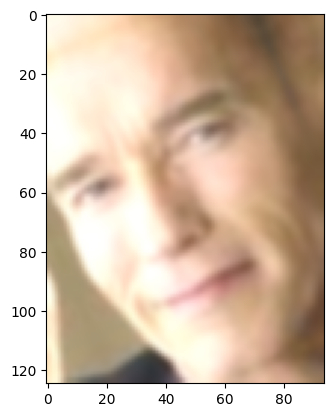

In [94]:
import matplotlib.pyplot as plt
plt.imshow(augmented_class_images[6][145])
print(augmented_class_images[6][145])

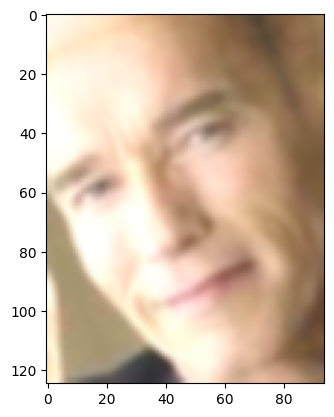

In [97]:
image_uint8 = (augmented_class_images[6][145] * 255).astype(np.uint8)
plt.imshow(image_uint8)

In [95]:
print(len(lfw_people.target_names))

62


In [98]:
import os
import cv2
import json
import shutil

# File path to save the list
file_path = 'names_labels.txt'

# Save the list to a file
with open(file_path, 'w') as file:
    for string in lfw_people.target_names:
        file.write(f"{string}\n")

print(f"List of strings saved to {file_path}")

# Directory to save images
save_dir = 'augmented_images'

# Clear existing directory if it exists
if os.path.exists(save_dir):
    shutil.rmtree(save_dir)

# Create directory
os.makedirs(save_dir)

# Save augmented images to folders based on labels
for label, images in augmented_class_images.items():
    label_dir = os.path.join(save_dir, lfw_people.target_names[label] + "_" + str(label))
    if not os.path.exists(label_dir):
        os.makedirs(label_dir)
    
    # Save image
    for i, image in enumerate(images):
        image_path = os.path.join(label_dir, f'image_{i+1}.png')
        image = (image * 255).astype(np.uint8)
        cv2.imwrite(image_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))


List of strings saved to names_labels.txt


In [2]:
import os
import cv2
import json
import shutil

# File path from which to retrieve the list
file_path = 'names_labels.txt'

def read_labels_from_file(file_path):
    # Check if the file exists
    if not os.path.exists(file_path):
        print(f"File {file_path} does not exist.")
        return None

    # Read the file and store each line as an item in a list
    with open(file_path, 'r') as file:
        strings_list = [line.strip() for line in file.readlines()]

    return strings_list

# Retrieve the list of strings from the file
images_names = read_labels_from_file(file_path)

if images_names:
    print(f"Retrieved list of strings: {images_names}")


Retrieved list of strings: ['Alejandro Toledo', 'Alvaro Uribe', 'Amelie Mauresmo', 'Andre Agassi', 'Angelina Jolie', 'Ariel Sharon', 'Arnold Schwarzenegger', 'Atal Bihari Vajpayee', 'Bill Clinton', 'Carlos Menem', 'Colin Powell', 'David Beckham', 'Donald Rumsfeld', 'George Robertson', 'George W Bush', 'Gerhard Schroeder', 'Gloria Macapagal Arroyo', 'Gray Davis', 'Guillermo Coria', 'Hamid Karzai', 'Hans Blix', 'Hugo Chavez', 'Igor Ivanov', 'Jack Straw', 'Jacques Chirac', 'Jean Chretien', 'Jennifer Aniston', 'Jennifer Capriati', 'Jennifer Lopez', 'Jeremy Greenstock', 'Jiang Zemin', 'John Ashcroft', 'John Negroponte', 'Jose Maria Aznar', 'Juan Carlos Ferrero', 'Junichiro Koizumi', 'Kofi Annan', 'Laura Bush', 'Lindsay Davenport', 'Lleyton Hewitt', 'Luiz Inacio Lula da Silva', 'Mahmoud Abbas', 'Megawati Sukarnoputri', 'Michael Bloomberg', 'Naomi Watts', 'Nestor Kirchner', 'Paul Bremer', 'Pete Sampras', 'Recep Tayyip Erdogan', 'Ricardo Lagos', 'Roh Moo-hyun', 'Rudolph Giuliani', 'Saddam Huss

In [3]:
import os
import cv2

def retrieve_images(folder='augmented_images'):
    all_images = {}
    
    # Check if the folder exists
    if not os.path.exists(folder):
        print(f"Folder {folder} does not exist.")
        return None

    # Loop through subdirectories (labels) in the main directory
    for label_dir in os.listdir(folder):
        label_path = os.path.join(folder, label_dir)
        
        # Check if the path is a directory
        if os.path.isdir(label_path):
            images = []
            
            # Loop through image files in the label directory
            for filename in os.listdir(label_path):
                if filename.endswith('.png'):
                    image_path = os.path.join(label_path, filename)
                    
                    # Read and append image
                    image = cv2.imread(image_path)
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    images.append(image)

            # Extract label from the directory path
            label = int(label_dir.split('_')[-1])
            
            # Add images to the dictionary with label as key
            all_images[label] = images

    return all_images

# Example usage:
all_images = retrieve_images()

# Print the retrieved images for each label
for label, images in all_images.items():
    print(f"Label: {label}, Number of images: {len(images)}")


Label: 0, Number of images: 200
Label: 1, Number of images: 200
Label: 2, Number of images: 200
Label: 3, Number of images: 200
Label: 4, Number of images: 200
Label: 5, Number of images: 200
Label: 6, Number of images: 200
Label: 7, Number of images: 200
Label: 8, Number of images: 200
Label: 9, Number of images: 200
Label: 10, Number of images: 200
Label: 11, Number of images: 200
Label: 12, Number of images: 200
Label: 13, Number of images: 200
Label: 14, Number of images: 200
Label: 15, Number of images: 200
Label: 16, Number of images: 200
Label: 17, Number of images: 200
Label: 18, Number of images: 200
Label: 19, Number of images: 200
Label: 20, Number of images: 200
Label: 21, Number of images: 200
Label: 22, Number of images: 200
Label: 23, Number of images: 200
Label: 24, Number of images: 200
Label: 25, Number of images: 200
Label: 26, Number of images: 200
Label: 27, Number of images: 200
Label: 28, Number of images: 200
Label: 29, Number of images: 200
Label: 30, Number of

In [154]:
for label, images in all_images.items():
    print(type(label))
    break

<class 'int'>


(125, 94, 3)


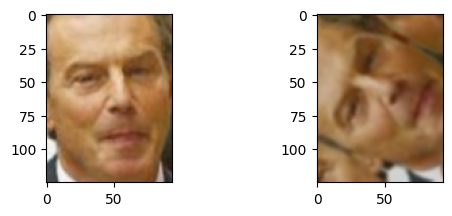

In [102]:
import matplotlib.pyplot as plt
# Define Albumentations transformations
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=(-90, 90), p=1.0),  # Random rotation between -30 and 30 degrees
    A.RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=1.0),
    A.Blur(blur_limit=3, p=0.5),
])

plt.subplot(2, 2, 1)
plt.imshow(class_images_sorted[58][143])

augmented = transform(image=class_images_sorted[58][143])
augmented_image = augmented["image"]
plt.subplot(2, 2, 2)
plt.imshow(augmented_image)
print(augmented_image.shape)


In [56]:
print(augmented_class_images[58][144])

[[[-0.99825716 -0.9930284  -0.9930284 ]
  [-0.99825716 -0.9956427  -0.9938998 ]
  [-0.9973857  -0.99651426 -0.9930284 ]
  ...
  [-0.99651426 -0.99825716 -0.9973857 ]
  [-0.9991286  -0.99700505 -0.9956427 ]
  [-1.         -0.99874794 -0.9947713 ]]

 [[-0.99825716 -0.9956427  -0.9956427 ]
  [-0.99825716 -0.9973857  -0.99651426]
  [-0.9973857  -0.99651426 -0.9956427 ]
  ...
  [-0.9947713  -0.9973857  -0.9973857 ]
  [-0.99651426 -0.99719536 -0.9956427 ]
  [-0.9973857  -0.99719536 -0.9947713 ]]

 [[-0.9973857  -0.9956427  -0.9956427 ]
  [-0.99825716 -0.99651426 -0.9956427 ]
  [-0.99825716 -0.99651426 -0.9956427 ]
  ...
  [-0.9947713  -0.99651426 -0.99651426]
  [-0.99651426 -0.9963239  -0.9947713 ]
  [-0.9956427  -0.99719536 -0.9930284 ]]

 ...

 [[-0.9943041  -0.99721783 -0.9956427 ]
  [-0.99544525 -0.9963464  -0.9956427 ]
  [-0.9963168  -0.99651426 -0.9947713 ]
  ...
  [-0.9921569  -0.9956427  -0.99825716]
  [-0.9947713  -0.99651426 -0.99825716]
  [-0.9947713  -0.99651426 -0.99651426]]

 [

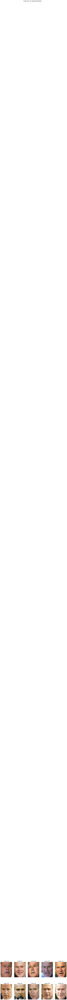

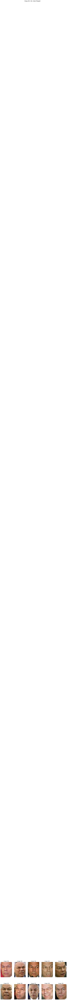

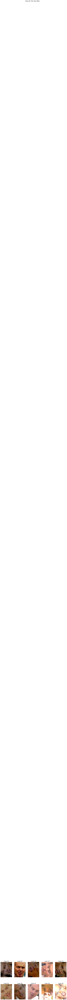

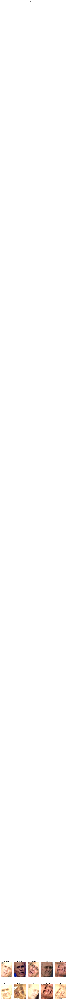

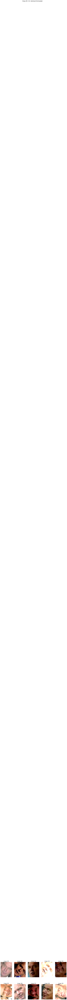

...

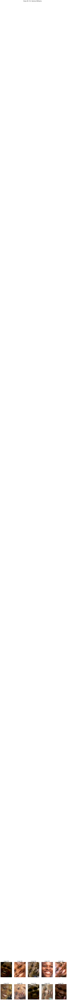

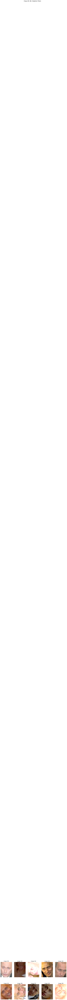

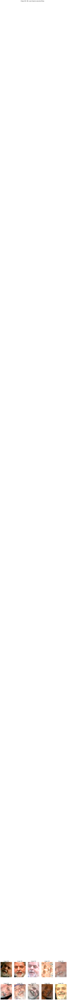

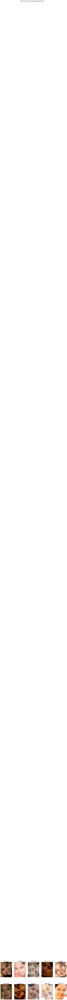

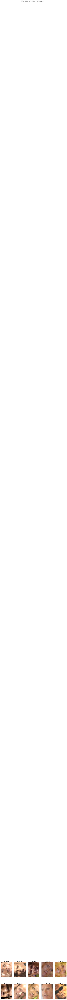

KeyboardInterrupt: 

In [137]:
import matplotlib.pyplot as plt

for class_id, images in augmented_class_images.items():
    num_images = len(images)
    
    plt.figure(figsize=(15, 5 * (num_images // 5 + 1)))
    plt.suptitle(f"Class ID: {class_id}, {lfw_people.target_names[class_id]}", fontsize=16)
    
    for i in range(num_images-1, -1, -1):
        plt.subplot(num_images // 5 + 1, 5, i + 1)
        plt.imshow(images[i])  # Assuming grayscale images
        plt.axis('off')
        plt.title(f"Image {i}")
        if i == 190:
            break
    
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


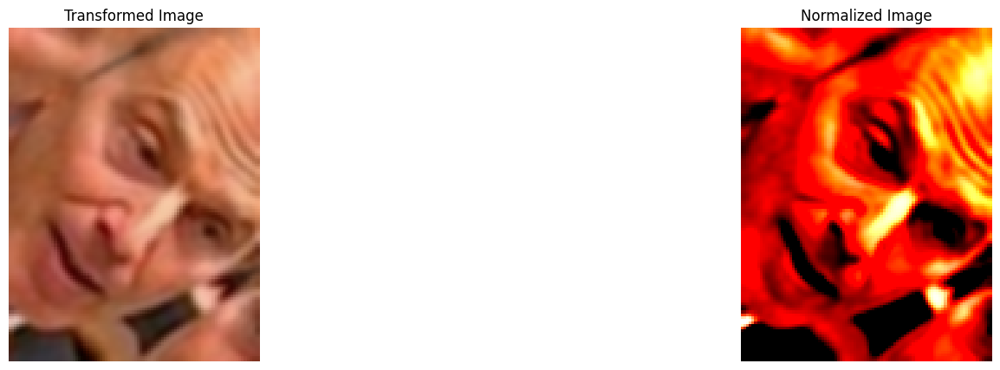

In [150]:
mean = augmented_class_images[58][144].flatten().mean(axis=0)
std = augmented_class_images[58][144].flatten().std(axis=0)

# Normalize image
normalized_image = (augmented_class_images[58][144].flatten() - mean) / std

# Display original, transformed, and normalized images
plt.figure(figsize=(20, 5))

plt.subplot(1, 2, 1)
plt.title("Transformed Image")
plt.imshow(augmented_class_images[58][144])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Normalized Image")
plt.imshow(normalized_image.reshape(125, 94, 3))
plt.axis('off')

plt.show()


In [152]:
augmented_class_images[58][144].max()

0.9714011

In [138]:
for class_id, images in augmented_class_images.items():
    print(f"Class {class_id}, {lfw_people.target_names[class_id]}: {images.shape[0]} images")

Class 14, George W Bush: 200 images
Class 10, Colin Powell: 200 images
Class 58, Tony Blair: 200 images
Class 12, Donald Rumsfeld: 200 images
Class 15, Gerhard Schroeder: 200 images
Class 5, Ariel Sharon: 200 images
Class 21, Hugo Chavez: 200 images
Class 35, Junichiro Koizumi: 200 images
Class 25, Jean Chretien: 200 images
Class 31, John Ashcroft: 200 images
Class 24, Jacques Chirac: 200 images
Class 53, Serena Williams: 200 images
Class 60, Vladimir Putin: 200 images
Class 40, Luiz Inacio Lula da Silva: 200 images
Class 16, Gloria Macapagal Arroyo: 200 images
Class 6, Arnold Schwarzenegger: 200 images
Class 27, Jennifer Capriati: 200 images
Class 37, Laura Bush: 200 images
Class 39, Lleyton Hewitt: 200 images
Class 0, Alejandro Toledo: 200 images
Class 20, Hans Blix: 200 images
Class 45, Nestor Kirchner: 200 images
Class 3, Andre Agassi: 200 images
Class 1, Alvaro Uribe: 200 images
Class 42, Megawati Sukarnoputri: 200 images
Class 54, Silvio Berlusconi: 200 images
Class 57, Tom Ridge

In [5]:
import numpy as np

flattened_images = []
labels = []

# Iterate over each class in augmented_class_images
for class_id, images in all_images.items():
    # Flatten each image and append to flattened_images
    flattened_images.extend([image.flatten() for image in images])
    # Create labels for each image in the class and append to labels
    labels.extend([class_id] * len(images))

# Convert lists to numpy arrays
flattened_images = np.array(flattened_images)
labels = np.array(labels)

# Shuffle the data
shuffled_indices = np.random.permutation(len(flattened_images))
flattened_images = flattened_images[shuffled_indices]/255
labels = labels[shuffled_indices]


In [6]:
flattened_images[0]

array([0.63137255, 0.36078431, 0.27843137, ..., 0.42352941, 0.15686275,
       0.08627451])

In [7]:
type(label)

int

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [9]:
pca = PCA()
X_pca = pca.fit_transform(flattened_images)


In [ ]:

# Get explained variance
explained_variance = pca.explained_variance_

# Print explained variance for each principal component
for i, variance in enumerate(explained_variance):
    print(f"Explained Variance of Component {i+1}: {variance:.4f}")

# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)
print("\nCumulative Explained Variance:")
for i, variance in enumerate(cumulative_explained_variance):
    print(f"Component {i+1}: {variance:.4f}")

In [10]:
cumulative_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

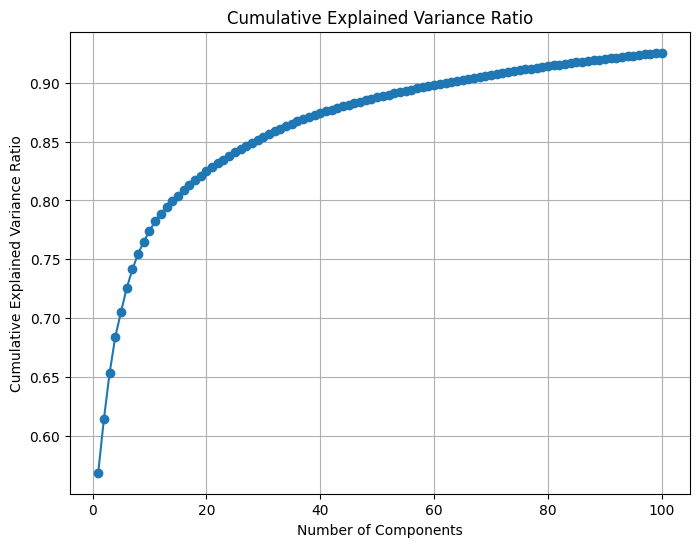

In [12]:
import matplotlib.pyplot as plt

first_cum = cumulative_explained_variance_ratio[:100]
# Plot the cumulative explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(first_cum) + 1), first_cum, marker='o', linestyle='-')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

In [13]:
cumulative_explained_variance_ratio[100]

0.925881750926422

In [15]:
eigenvectors = pca.components_[:100]

import joblib

# Save eigenvectors to a file using joblib
joblib.dump(eigenvectors, 'eigenvectors.joblib')

eigenvectors.shape

(100, 35250)

In [ ]:
import joblib

# Load eigenvectors from file using joblib
eigenvectors = joblib.load('eigenvectors.joblib')

In [16]:
top_100_eigenvectors = eigenvectors

In [17]:
reduced_flattened_images = np.dot(flattened_images, top_100_eigenvectors.T)
reduced_flattened_images.shape

(12400, 100)

In [18]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(reduced_flattened_images, labels, test_size=0.2, random_state=42)


In [19]:

# Initialize SVM classifier
svm_clf = SVC()

# Train the classifiers
svm_clf.fit(X_train, y_train)

print(accuracy_score(y_train, svm_clf.predict(X_train)))
# Make predictions on test set
y_pred = svm_clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


0.18125
Test Accuracy: 0.1294


In [ ]:
# Extract training scores
train_scores = grid_search.cv_results_['mean_train_score']
params = grid_search.cv_results_['params']

In [ ]:
# Create labels for the bar plot
labels = [f"{param['kernel']} (C={param['C']}, gamma={param['gamma']}, degree={param['degree']})" for param in params]

# Create bar plot
plt.figure(figsize=(14, 7))
plt.bar(labels, train_scores, color='blue')
plt.xlabel('Parameter Combinations')
plt.ylabel('Mean Training Accuracy')
plt.title('Training Accuracy for Different Parameter Combinations')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.tight_layout()
plt.show()

In [ ]:
svm_pred = grid_search.predict(X_test)

In [22]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]
}

# Initialize k-NN classifier
knn_clf = KNeighborsClassifier()

# Initialize GridSearchCV
grid_search_knn = GridSearchCV(knn_clf, param_grid, cv=5, scoring='accuracy', n_jobs=-1, return_train_score=True, verbose=2)

# Perform GridSearchCV
grid_search_knn.fit(X_train, y_train)

# Extract training scores
train_scores = grid_search_knn.cv_results_['mean_train_score']
params = grid_search_knn.cv_results_['params']


Fitting 5 folds for each of 64 candidates, totalling 320 fits


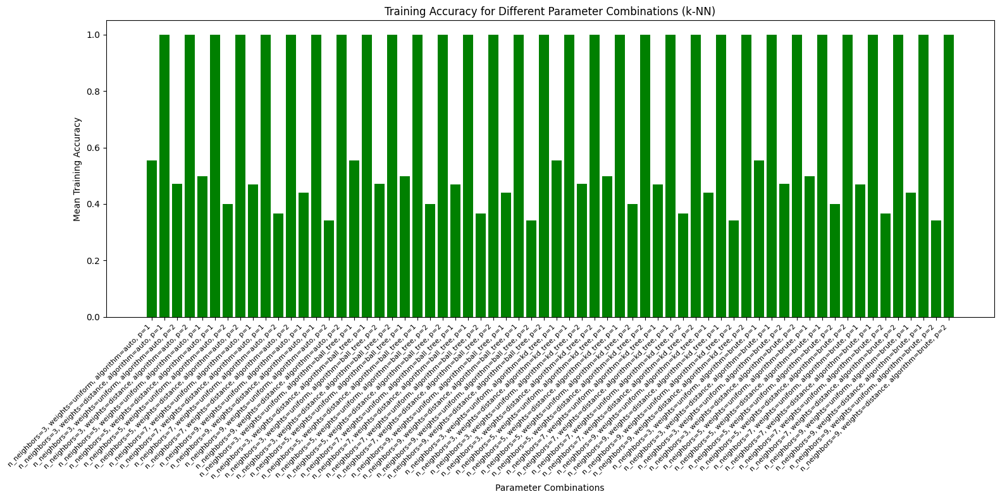

In [23]:
# Create labels for the bar plot
labels = [f"n_neighbors={param['n_neighbors']}, weights={param['weights']}, algorithm={param['algorithm']}, p={param['p']}" for param in params]

# Create bar plot
plt.figure(figsize=(16, 8))
plt.bar(labels, train_scores, color='green')
plt.xlabel('Parameter Combinations')
plt.ylabel('Mean Training Accuracy')
plt.title('Training Accuracy for Different Parameter Combinations (k-NN)')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.tight_layout()
plt.show()

In [30]:
threshold = 0.8  # Define the threshold
for params, mean_train_score in zip(grid_search_knn.cv_results_['params'], grid_search_knn.cv_results_['mean_train_score']):
    if mean_train_score > threshold:
        # Use the best estimator from GridSearchCV
        best_knn = grid_search_knn.best_estimator_
        
        # Manually set different hyperparameters
        best_knn.set_params(**params)
        
        # Predict on the test set
        y_pred_other = best_knn.predict(X_test)
        
        # Calculate the test accuracy
        test_accuracy_other = accuracy_score(y_test, y_pred_other)
        print(f"Test Accuracy with other_params: {test_accuracy_other:.4f}")
        print(f"Params: {params}, Mean Test Score: {mean_train_score:.4f}")
        print()

Test Accuracy with other_params: 0.3294
Params: {'algorithm': 'auto', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3294
Params: {'algorithm': 'auto', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3202
Params: {'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3202
Params: {'algorithm': 'auto', 'n_neighbors': 5, 'p': 2, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3117
Params: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3117
Params: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}, Mean Test Score: 1.0000

Test Accuracy with other_params: 0.3012
Params: {'algorithm': 'auto', 'n_neighbors': 9, 'p': 1, 'weights': 'distance'}, Mean Test 

In [26]:
params

{'algorithm': 'brute', 'n_neighbors': 9, 'p': 2, 'weights': 'distance'}

In [27]:
# Use the best estimator from GridSearchCV to predict on the test set
y_pred = grid_search_knn.best_estimator_.predict(X_test)

# Calculate the test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy with best_params: {test_accuracy:.4f}")


Test Accuracy with best_params: 0.3294


In [227]:
# Initialize k-NN classifier
knn_clf = KNeighborsClassifier()

# Perform GridSearchCV
knn_clf.fit(X_train, y_train)

KNeighborsClassifier()

In [228]:
print(accuracy_score(y_train, knn_clf.predict(X_train)))

0.41774193548387095


In [232]:
knn_pred = knn_clf.predict(X_test)
print(accuracy_score(y_test, knn_pred))

0.14233870967741935


In [31]:
# Split dataset into training and test sets
X_train_torch, X_val_torch, y_train_torch, y_val_torch = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim

In [33]:
y_train_torch

array([10, 13, 34, ..., 59,  5, 58])

In [34]:
# Convert NumPy arrays to PyTorch tensors
X_train_tensor = torch.tensor(X_train_torch, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_torch, dtype=torch.long)
X_val_tensor = torch.tensor(X_val_torch, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val_torch, dtype=torch.long)


In [35]:

# Define deeper MLP model with non-linearity
class DeepMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, hidden_dim3, output_dim):
        super(DeepMLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim1)
        self.fc2 = nn.Linear(hidden_dim1, output_dim)
        # self.fc3 = nn.Linear(hidden_dim2, output_dim)
        # self.fc4 = nn.Linear(hidden_dim3, output_dim)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        # x = torch.relu(self.fc2(x))
        # x = torch.relu(self.fc3(x))
        x = self.fc2(x)
        return x



In [36]:

# Initialize model, loss, and optimizer
input_dim = X_train.shape[1]
hidden_dim1, hidden_dim2, hidden_dim3 = 128, 128, 64
output_dim = len(torch.unique(y_train_tensor))
model = DeepMLP(input_dim, hidden_dim1, hidden_dim2, hidden_dim3, output_dim)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [37]:
epochs = 1000
train_losses_mlp = []
train_accuracies_mlp = []
val_accuracies_mlp = []

for epoch in range(epochs):
    # Shuffle the data
    shuffled_indices = np.random.permutation(len(X_train_tensor))
    X_train_tensor = X_train_tensor[shuffled_indices]
    y_train_tensor = y_train_tensor[shuffled_indices]
    
    # Forward pass
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Compute training accuracy
    _, predicted = torch.max(outputs, 1)
    accuracy_train = (predicted == y_train_tensor).sum().item() / len(y_train_tensor)
    train_accuracies_mlp.append(accuracy_train)
    
    # Compute test accuracy
    model.eval()
    with torch.no_grad():
        outputs = model(X_val_tensor)
        _, predicted = torch.max(outputs, 1)
        accuracy_val = (predicted == y_val_tensor).sum().item() / len(y_val_tensor)
        val_accuracies_mlp.append(accuracy_val)
    
    # Store training loss
    train_losses_mlp.append(loss.item())
    
    # Print progress
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}, Train Accuracy: {accuracy_train:.4f}, Validation Accuracy: {accuracy_val:.4f}')


Epoch [10/1000], Loss: 4.4348, Train Accuracy: 0.0234, Validation Accuracy: 0.0212
Epoch [20/1000], Loss: 4.1309, Train Accuracy: 0.0370, Validation Accuracy: 0.0287
Epoch [30/1000], Loss: 3.8971, Train Accuracy: 0.0777, Validation Accuracy: 0.0590
Epoch [40/1000], Loss: 3.6706, Train Accuracy: 0.1336, Validation Accuracy: 0.0993
Epoch [50/1000], Loss: 3.4311, Train Accuracy: 0.1898, Validation Accuracy: 0.1290
Epoch [60/1000], Loss: 3.1867, Train Accuracy: 0.2310, Validation Accuracy: 0.1678
Epoch [70/1000], Loss: 2.9545, Train Accuracy: 0.2855, Validation Accuracy: 0.2097
Epoch [80/1000], Loss: 2.7499, Train Accuracy: 0.3346, Validation Accuracy: 0.2455
Epoch [90/1000], Loss: 2.5777, Train Accuracy: 0.3729, Validation Accuracy: 0.2601
Epoch [100/1000], Loss: 2.4349, Train Accuracy: 0.4060, Validation Accuracy: 0.2752
Epoch [110/1000], Loss: 2.3144, Train Accuracy: 0.4335, Validation Accuracy: 0.2898
Epoch [120/1000], Loss: 2.2101, Train Accuracy: 0.4541, Validation Accuracy: 0.2969
E

NameError: name 'train_losses_mlp' is not defined

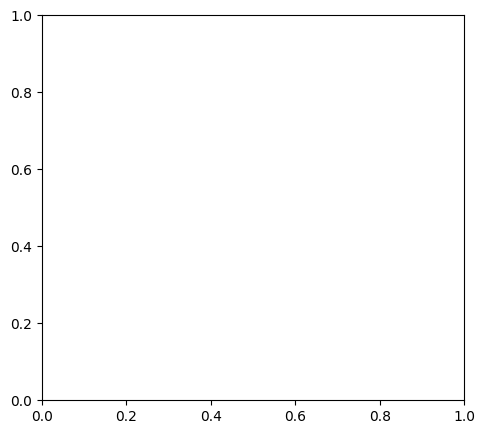

In [1]:
# Plot training loss and accuracies
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses_mlp, label='Training Loss', color='blue')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and test accuracies
plt.subplot(1, 2, 2)
plt.plot(train_accuracies_mlp, label='Training Accuracy', color='green')
plt.plot(val_accuracies_mlp, label='Val Accuracy', color='red')
plt.title('Training and Val Accuracies')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [39]:
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)


In [40]:

outputs = model(X_test_tensor)
_, predicted = torch.max(outputs, 1)
accuracy_test_mlp = (predicted == y_test_tensor).sum().item() / len(y_val_tensor)
accuracy_test_mlp

0.45110887096774194

In [41]:
images_for_cnn = []
labels_for_cnn = []

# Iterate over each class in augmented_class_images
for class_id, images in all_images.items():
    # Flatten each image and append to flattened_images
    images_for_cnn.extend([image for image in images])
    # Create labels for each image in the class and append to labels
    labels_for_cnn.extend([class_id] * len(images))


In [188]:
np.array(images_for_cnn)

array([[[[ 54,  44,  34],
         [ 56,  46,  36],
         [ 60,  47,  38],
         ...,
         [ 63,  45,  35],
         [ 59,  41,  31],
         [ 53,  35,  25]],

        [[ 55,  42,  33],
         [ 55,  41,  32],
         [ 55,  41,  30],
         ...,
         [ 71,  53,  43],
         [ 67,  49,  39],
         [ 64,  46,  36]],

        [[ 52,  34,  24],
         [ 54,  36,  26],
         [ 53,  37,  24],
         ...,
         [ 76,  58,  46],
         [ 77,  60,  50],
         [ 74,  57,  47]],

        ...,

        [[ 74,  55,  49],
         [ 91,  72,  66],
         [112,  88,  78],
         ...,
         [101,  83,  71],
         [ 75,  56,  49],
         [ 69,  50,  44]],

        [[ 73,  56,  49],
         [ 92,  73,  67],
         [117,  92,  85],
         ...,
         [ 94,  76,  66],
         [ 73,  54,  47],
         [ 70,  51,  47]],

        [[ 72,  55,  48],
         [ 92,  73,  67],
         [118,  95,  87],
         ...,
         [ 86,  67,  60],
        

In [215]:
import torchvision.transforms as transforms
from PIL import Image
import numpy as np

def resize_images(images):
    """
    Resize a list of images to 32x32 pixels with 3 channels using PyTorch.
    
    Args:
    - images (list): List of images to resize.
    
    Returns:
    - resized_images (list): List of resized images as PyTorch tensors.
    """
    # Define the transformation
    transform = transforms.Compose([
        transforms.Resize((32, 32), interpolation=Image.BILINEAR),
        transforms.ToTensor(),
    ])
    
    resized_images = []
    
    for image in images:
        # Convert numpy array to PIL Image
        image_pil = Image.fromarray(np.uint8(image))
        
        # Apply transformation
        resized_image = transform(image_pil)
        
        resized_images.append(resized_image)
    
    return resized_images

# Example usage:
# Assuming 'images' is a list of numpy arrays representing images
# resized_images = resize_images(images)


In [211]:
resized_images_for_cnn = resize_images(images_for_cnn)

In [219]:
resized_images_for_cnn = resize_images(np.array(resized_images_for_cnn).reshape(12400, 96, 96, 3))

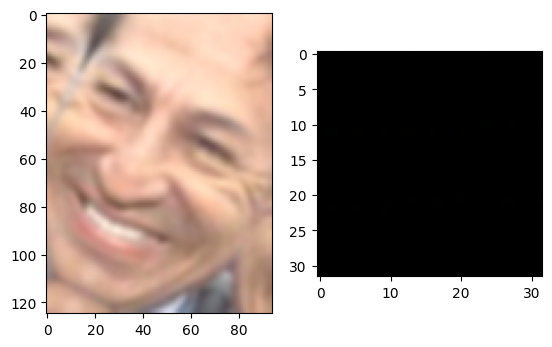

In [222]:
plt.subplot(1, 2, 1)
plt.imshow(images_for_cnn[8])

plt.subplot(1, 2, 2)
plt.imshow(np.array(resized_images_for_cnn[8]).reshape(32, 32, 3))

In [2]:
import os
import cv2

def retrieve_images(folder='augmented_images'):
    all_images = {}
    
    # Check if the folder exists
    if not os.path.exists(folder):
        print(f"Folder {folder} does not exist.")
        return None

    # Loop through subdirectories (labels) in the main directory
    for label_dir in os.listdir(folder):
        label_path = os.path.join(folder, label_dir)
        
        # Check if the path is a directory
        if os.path.isdir(label_path):
            images = []
            
            # Loop through image files in the label directory
            for filename in os.listdir(label_path):
                if filename.endswith('.png'):
                    image_path = os.path.join(label_path, filename)
                    
                    # Read and append image
                    image = cv2.imread(image_path)
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    images.append(image)

            # Extract label from the directory path
            label = int(label_dir.split('_')[-1])
            
            # Add images to the dictionary with label as key
            all_images[label] = images

    return all_images

# Example usage:
all_images = retrieve_images()

# Print the retrieved images for each label
for label, images in all_images.items():
    print(f"Label: {label}, Number of images: {len(images)}")


Label: 0, Number of images: 200
Label: 1, Number of images: 200
Label: 2, Number of images: 200
Label: 3, Number of images: 200
Label: 4, Number of images: 200
Label: 5, Number of images: 200
Label: 6, Number of images: 200
Label: 7, Number of images: 200
Label: 8, Number of images: 200
Label: 9, Number of images: 200
Label: 10, Number of images: 200
Label: 11, Number of images: 200
Label: 12, Number of images: 200
Label: 13, Number of images: 200
Label: 14, Number of images: 200
Label: 15, Number of images: 200
Label: 16, Number of images: 200
Label: 17, Number of images: 200
Label: 18, Number of images: 200
Label: 19, Number of images: 200
Label: 20, Number of images: 200
Label: 21, Number of images: 200
Label: 22, Number of images: 200
Label: 23, Number of images: 200
Label: 24, Number of images: 200
Label: 25, Number of images: 200
Label: 26, Number of images: 200
Label: 27, Number of images: 200
Label: 28, Number of images: 200
Label: 29, Number of images: 200
Label: 30, Number of

In [3]:
images_for_cnn = []
labels_for_cnn = []

# Iterate over each class in augmented_class_images
for class_id, images in all_images.items():
    # Flatten each image and append to flattened_images
    images_for_cnn.extend([image for image in images])
    # Create labels for each image in the class and append to labels
    labels_for_cnn.extend([class_id] * len(images))


In [5]:
np.array(resized_images_for_cnn[8]).reshape(32, 32, 3)

NameError: name 'resized_images_for_cnn' is not defined

In [6]:
X_train_for_cnn, X_test_for_cnn, y_train_for_cnn, y_test_for_cnn = train_test_split(np.array(images_for_cnn), np.array(labels_for_cnn), test_size=0.2, random_state=42)
X_train_for_cnn, X_val_for_cnn, y_train_for_cnn, y_val_for_cnn = train_test_split(X_train_for_cnn, y_train_for_cnn, test_size=0.2, random_state=42)


In [7]:
# Convert NumPy arrays to PyTorch tensors
X_train_tensor_for_cnn = torch.tensor(X_train_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94)
y_train_tensor_for_cnn = torch.tensor(y_train_for_cnn, dtype=torch.long)
X_val_tensor_for_cnn = torch.tensor(X_val_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94)
y_val_tensor_for_cnn = torch.tensor(y_val_for_cnn, dtype=torch.long)
X_test_tensor_for_cnn = torch.tensor(X_test_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94)
y_test_tensor_for_cnn = torch.tensor(y_test_for_cnn, dtype=torch.long)

In [8]:
X_train_tensor_for_cnn.shape

torch.Size([5504, 3, 125, 94])

In [14]:
import torch
import torch.nn as nn

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        
        # Max pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.fc1 = nn.Linear(64 * 31 * 23, 128)  # Adjusted based on the input image size after pooling
        self.fc2 = nn.Linear(128, len(torch.unique(y_train_tensor_for_cnn)))  # Output layer

    def forward(self, x):
        # First convolutional layer followed by max pooling and ReLU activation
        x = self.pool(torch.relu(self.conv1(x)))
        
        # Second convolutional layer followed by max pooling and ReLU activation
        x = self.pool(torch.relu(self.conv2(x)))
        
        # Flatten the tensor for fully connected layers
        x = x.view(-1, 64 * 31 * 23)
        
        # Fully connected layers with ReLU activation
        x = torch.relu(self.fc1(x))
        
        # Output layer
        x = self.fc2(x)
        
        return x


In [16]:
# Initialize model, loss, and optimizer
model_cnn = CNN()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_cnn.parameters(), lr=0.001)

# Training loop
epochs = 50
train_losses_cnn = []
train_accuracies_cnn = []
val_accuracies_cnn = []


In [17]:

for epoch in range(epochs):
    # Shuffle the data
    shuffled_indices = np.random.permutation(len(X_train_tensor_for_cnn))
    X_train_tensor_for_cnn = X_train_tensor_for_cnn[shuffled_indices]
    y_train_tensor_for_cnn = y_train_tensor_for_cnn[shuffled_indices]
    
    # Forward pass
    outputs = model_cnn(X_train_tensor_for_cnn)
    loss = criterion(outputs, y_train_tensor_for_cnn)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Compute training accuracy
    _, predicted = torch.max(outputs, 1)
    train_accuracy_cnn = (predicted == y_train_tensor_for_cnn).sum().item() / len(y_train_tensor_for_cnn)
    train_accuracies_cnn.append(train_accuracy_cnn)
    
    # Compute test accuracy
    model.eval()
    with torch.no_grad():
        outputs = model_cnn(X_val_tensor_for_cnn)
        _, predicted = torch.max(outputs, 1)
        val_accuracy_cnn = (predicted == y_val_tensor_for_cnn).sum().item() / len(y_val_tensor_for_cnn)
        val_accuracies_cnn.append(val_accuracy_cnn)
    
    # Store training loss
    train_losses_cnn.append(loss.item())
    
    # Print progress
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}, Train Accuracy: {train_accuracy_cnn:.4f}, Val Accuracy: {val_accuracy_cnn:.4f}')


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim

# Assuming CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Convert NumPy arrays to PyTorch tensors
X_train_tensor_for_cnn = torch.tensor(X_train_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94).to(device)
y_train_tensor_for_cnn = torch.tensor(y_train_for_cnn, dtype=torch.long).to(device)
X_val_tensor_for_cnn = torch.tensor(X_val_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94).to(device)
y_val_tensor_for_cnn = torch.tensor(y_val_for_cnn, dtype=torch.long).to(device)
X_test_tensor_for_cnn = torch.tensor(X_test_for_cnn, dtype=torch.float32).view(-1, 3, 125, 94).to(device)
y_test_tensor_for_cnn = torch.tensor(y_test_for_cnn, dtype=torch.long).to(device)

# Define the CNN model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        
        # Max pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.fc1 = nn.Linear(64 * 31 * 23, 128)  # Adjusted based on the input image size after pooling
        self.fc2 = nn.Linear(128, len(torch.unique(y_train_tensor_for_cnn)))  # Output layer

    def forward(self, x):
        # First convolutional layer followed by max pooling and ReLU activation
        x = self.pool(torch.relu(self.conv1(x)))
        
        # Second convolutional layer followed by max pooling and ReLU activation
        x = self.pool(torch.relu(self.conv2(x)))
        
        # Flatten the tensor for fully connected layers
        x = x.view(-1, 64 * 31 * 23)
        
        # Fully connected layers with ReLU activation
        x = torch.relu(self.fc1(x))
        
        # Output layer
        x = self.fc2(x)
        
        return x

# Initialize model, loss, and optimizer
model_cnn = CNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_cnn.parameters(), lr=0.001)

# Training loop
epochs = 50
train_losses_cnn = []
train_accuracies_cnn = []
val_accuracies_cnn = []

for epoch in range(epochs):
    # Shuffle the data
    shuffled_indices = torch.randperm(len(X_train_tensor_for_cnn))
    X_train_tensor_for_cnn = X_train_tensor_for_cnn[shuffled_indices]
    y_train_tensor_for_cnn = y_train_tensor_for_cnn[shuffled_indices]
    
    # Forward pass
    outputs = model_cnn(X_train_tensor_for_cnn)
    loss = criterion(outputs, y_train_tensor_for_cnn)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Compute training accuracy
    _, predicted = torch.max(outputs, 1)
    train_accuracy_cnn = (predicted == y_train_tensor_for_cnn).sum().item() / len(y_train_tensor_for_cnn)
    train_accuracies_cnn.append(train_accuracy_cnn)
    
    # Compute validation accuracy
    model_cnn.eval()
    with torch.no_grad():
        outputs = model_cnn(X_val_tensor_for_cnn)
        _, predicted = torch.max(outputs, 1)
        val_accuracy_cnn = (predicted == y_val_tensor_for_cnn).sum().item() / len(y_val_tensor_for_cnn)
        val_accuracies_cnn.append(val_accuracy_cnn)
    
    # Store training loss
    train_losses_cnn.append(loss.item())
    
    # Print progress
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}, Train Accuracy: {train_accuracy_cnn:.4f}, Val Accuracy: {val_accuracy_cnn:.4f}')


OutOfMemoryError: CUDA out of memory. Tried to allocate 7.71 GiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 8.86 GiB is allocated by PyTorch, and 6.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
# Plot training loss and accuracies
plt.figure(figsize=(12, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses_cnn, label='Training Loss', color='blue')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and test accuracies
plt.subplot(1, 2, 2)
plt.plot(train_accuracies_cnn, label='Training Accuracy', color='green')
plt.plot(val_accuracies_cnn, label='Val Accuracy', color='red')
plt.title('Training and Val Accuracies')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()